<a href="https://colab.research.google.com/github/vidishaaa/Fake_news_classification-/blob/main/Fake_news_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import seaborn as sns
import matplotlib.pyplot as plt
import nltk
import spacy
import re

In [ ]:
df= pd.read_csv("/content/WELFake_Dataset.csv" ,delimiter=',', encoding='ISO-8859-1', engine='python',on_bad_lines='skip')

 We are encountering Error tokenizing data. C error: EOF inside string starting at row 22993, typically occurs when there's an issue with the CSV file format, such as a missing or unclosed quotation mark in one of the rows. This can cause pandas to misinterpret the file's structure.

to fix this we have read the csv in a different format

In [ ]:
df.head()

,Unnamed: 0,title,text,label
0,0,LAW ENFORCEMENT ON HIGH ALERT Following Threat...,No comment is expected from Barack Obama Membe...,1
1,1,NaN,Did they post their votes for Hillary already?,1
2,2,UNBELIEVABLE! OBAMAâS ATTORNEY GENERAL SAYS ...,"Now, most of the demonstrators gathered last ...",1
3,3,"Bobby Jindal, raised Hindu, uses story of Chri...",A dozen politically active pastors came here f...,0
4,4,SATAN 2: Russia unvelis an image of its terrif...,"The RS-28 Sarmat missile, dubbed Satan 2, will...",1


##Pre processing
To pre process the data we will follow some initial steps:

Import Necessary Libraries and Load Data


Download NLTK Resources and Load SpaCy Model


Initial Data Inspection


Remove URLs from Text


Tokenization using SpaCy


Lemmatization using SpaCy


Removing Stopwords using NLTK


Removing Symbols and Special

Final Processed Text

In [ ]:
# Download NLTK stopwords
nltk.download('all')

# Load SpaCy English model
!python -m spacy download en_core_web_sm
nlp = spacy.load('en_core_web_sm')


[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_eng to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_eng.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_rus to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |  

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 73.5 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


In [ ]:
#Initial processing
df.isnull().sum()

,0
Unnamed: 0,0
title,29
text,15
label,15


In [ ]:
df['cleaned_text'] = df['text']

In [ ]:
# Fill missing values in the 'cleaned_text' column with an empty string
df['cleaned_text'] = df['cleaned_text'].fillna('')
# Drop rows where 'cleaned_text' is None or NaN
df = df.dropna(subset=['cleaned_text']).reset_index(drop=True)


In [ ]:
df = df.dropna(subset=['label']).reset_index(drop=True)

##TOKENIZATION
It is the first step when building any NLP model. It is the process of converting a sequence of texts into smaller parts called tokens

In [ ]:
from nltk.tokenize import word_tokenize
tokens=word_tokenize(df['text'][0])
print(tokens)

['No', 'comment', 'is', 'expected', 'from', 'Barack', 'Obama', 'Members', 'of', 'the', '#', 'FYF911', 'or', '#', 'FukYoFlag', 'and', '#', 'BlackLivesMatter', 'movements', 'called', 'for', 'the', 'lynching', 'and', 'hanging', 'of', 'white', 'people', 'and', 'cops', '.', 'They', 'encouraged', 'others', 'on', 'a', 'radio', 'show', 'Tuesday', 'night', 'to', 'turn', 'the', 'tide', 'and', 'kill', 'white', 'people', 'and', 'cops', 'to', 'send', 'a', 'message', 'about', 'the', 'killing', 'of', 'black', 'people', 'in', 'America.One', 'of', 'the', 'F', '*', '*', '*', 'YoFlag', 'organizers', 'is', 'called', 'Sunshine', '.', 'She', 'has', 'a', 'radio', 'blog', 'show', 'hosted', 'from', 'Texas', 'called', ',', 'Sunshine', 's', 'F', '*', '*', '*', 'ing', 'Opinion', 'Radio', 'Show', '.', 'A', 'snapshot', 'of', 'her', '#', 'FYF911', '@', 'LOLatWhiteFear', 'Twitter', 'page', 'at', '9:53', 'p.m.', 'shows', 'that', 'she', 'was', 'urging', 'supporters', 'to', 'Call', 'now', '!', '!', '#', 'fyf911', 'tonig

STOPWORDS

Removing stop words is useful when one wants to deal with only the most semantically important words in a text, and ignore words that are rarely semantically relevant, such as articles and prepositions.

In [ ]:
from nltk.corpus import stopwords
stopword=stopwords.words('english')
print(stopword)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

In [ ]:
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()

In [ ]:
cleaned_text=[]

In [ ]:
for text in df['text'].dropna():  # Dropping any NaN values in the text column

    # Step 1: Convert to lowercase
    text = text.lower()

    # Step 2: Remove URLs
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)

    # Step 3: Convert hashtags to words (strip the # symbol)
    text = re.sub(r'#(\w+)', r'\1', text)  # This converts #FakeNews to FakeNews

    # Step 4: Remove special characters, numbers, and punctuation
    text = re.sub(r'\W', ' ', text)
    text = re.sub(r'\d', '', text)

    #Step 5: Tokenize
    words = word_tokenize(text)

    # Step 6: Remove stopwords and perform lemmatization
    tokens = [lemmatizer.lemmatize(word) for word in tokens if word not in stopword]

    # Step 5: Join the tokens back into a single string
    text = ' '.join(tokens)

    # Step 8: Append the cleaned text to the list
    cleaned_text.append(text)



In [ ]:
print(cleaned_text)

['No comment expected Barack Obama Members # FYF911 # FukYoFlag # BlackLivesMatter movement called lynching hanging white people cop . They encouraged others radio show Tuesday night turn tide kill white people cop send message killing black people America.One F * * * YoFlag organizer called Sunshine . She radio blog show hosted Texas called , Sunshine F * * * ing Opinion Radio Show . A snapshot # FYF911 @ LOLatWhiteFear Twitter page 9:53 p.m. show urging supporter Call ! ! # fyf911 tonight continue dismantle illusion white Below SNAPSHOT Twitter Radio Call Invite # FYF911The radio show aired 10:00 p.m. eastern standard time.During show , caller clearly call lynching killing white people.A 2:39 minute clip radio show heard . It provided Breitbart Texas someone would like referred Hannibal . He already received death threat result interrupting # FYF911 conference calls.An unidentified black man said mother f * * kers , start f * * * ing . Like u , bunch ni * * er takin one u , roll . He

##VECTORIZATION
It is a fundamengtal step of NLP which involves converting text data into numerical representations that machnines can process

In [ ]:
cv = CountVectorizer()
x = cv.fit_transform(cleaned_text)

In [ ]:
tfidf_vectorizer = TfidfVectorizer()
X_tfidf = tfidf_vectorizer.fit_transform(cleaned_text)

##Model Building

In [ ]:
# Initialize vectorizers
cv = CountVectorizer()
tfidf_vectorizer = TfidfVectorizer()

# Fit and transform the cleaned text
X_count = cv.fit_transform(df['cleaned_text'])
X_tfidf = tfidf_vectorizer.fit_transform(df['cleaned_text'])

# Ensure that the target variable 'y' is correctly defined
y = df['label']

# Split the data into training and testing sets
X_train_count, X_test_count, y_train, y_test = train_test_split(X_count, y, test_size=0.2, random_state=42)
X_train_tfidf, X_test_tfidf, _, _ = train_test_split(X_tfidf, y, test_size=0.2, random_state=42)

# Logistic Regression with CountVectorizer
lr_count = LogisticRegression(max_iter=2000)
lr_count.fit(X_train_count, y_train)
y_pred_lr_count = lr_count.predict(X_test_count)

# Logistic Regression with TFIDFVectorizer
lr_tfidf = LogisticRegression(max_iter=2000)
lr_tfidf.fit(X_train_tfidf, y_train)
y_pred_lr_tfidf = lr_tfidf.predict(X_test_tfidf)

# SVC with CountVectorizer
svc_count = SVC()
svc_count.fit(X_train_count, y_train)
y_pred_svc_count = svc_count.predict(X_test_count)

# SVC with TFIDFVectorizer
svc_tfidf = SVC()
svc_tfidf.fit(X_train_tfidf, y_train)
y_pred_svc_tfidf = svc_tfidf.predict(X_test_tfidf)

# Random Forest with CountVectorizer
rf_count = RandomForestClassifier()
rf_count.fit(X_train_count, y_train)
y_pred_rf_count = rf_count.predict(X_test_count)

# Random Forest with TFIDFVectorizer
rf_tfidf = RandomForestClassifier()
rf_tfidf.fit(X_train_tfidf, y_train)
y_pred_rf_tfidf = rf_tfidf.predict(X_test_tfidf)


##Comparing the results

Classification Report for Logistic Regression with CountVectorizer:
               precision    recall  f1-score   support

           0       0.91      0.92      0.92       359
           1       0.92      0.92      0.92       379

    accuracy                           0.92       738
   macro avg       0.92      0.92      0.92       738
weighted avg       0.92      0.92      0.92       738



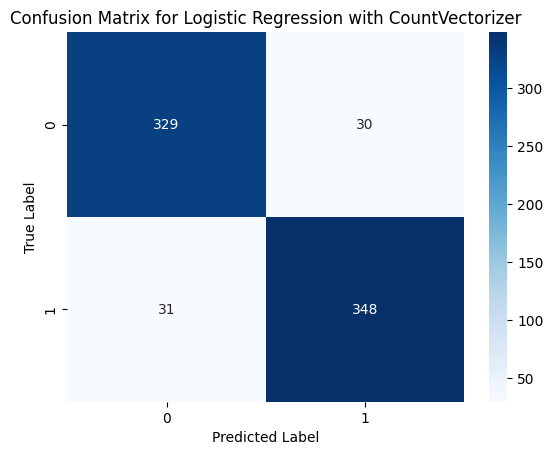

Classification Report for Logistic Regression with TFIDFVectorizer:
               precision    recall  f1-score   support

           0       0.94      0.89      0.91       359
           1       0.90      0.94      0.92       379

    accuracy                           0.92       738
   macro avg       0.92      0.92      0.92       738
weighted avg       0.92      0.92      0.92       738



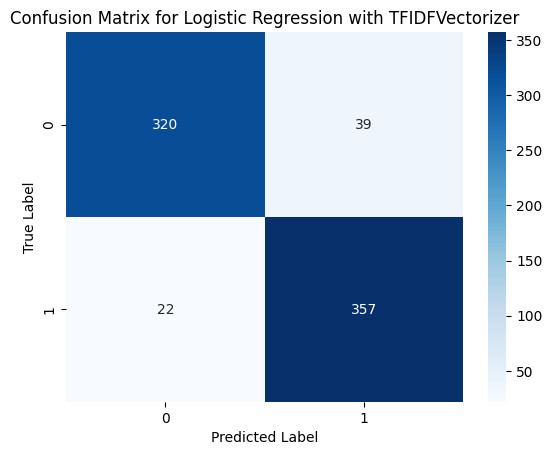

Classification Report for SVC with CountVectorizer:
               precision    recall  f1-score   support

           0       0.92      0.78      0.84       359
           1       0.82      0.94      0.87       379

    accuracy                           0.86       738
   macro avg       0.87      0.86      0.86       738
weighted avg       0.87      0.86      0.86       738



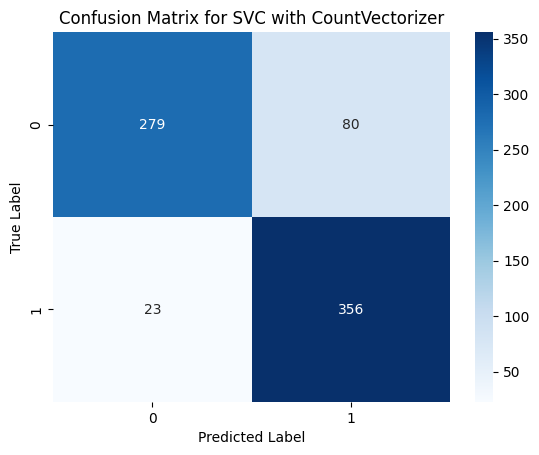

Classification Report for SVC with TFIDFVectorizer:
               precision    recall  f1-score   support

           0       0.94      0.89      0.91       359
           1       0.90      0.94      0.92       379

    accuracy                           0.92       738
   macro avg       0.92      0.92      0.92       738
weighted avg       0.92      0.92      0.92       738



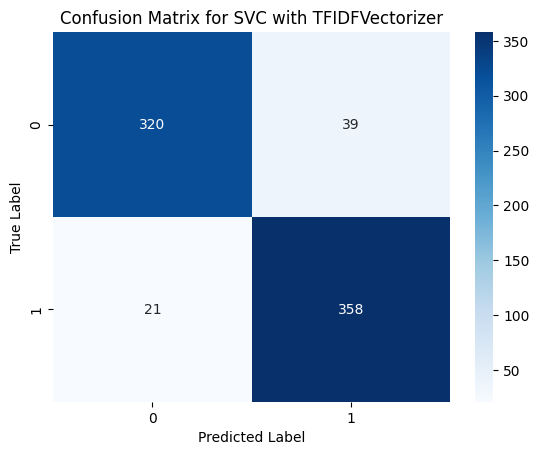

Classification Report for Random Forest with CountVectorizer:
               precision    recall  f1-score   support

           0       0.90      0.89      0.90       359
           1       0.90      0.91      0.90       379

    accuracy                           0.90       738
   macro avg       0.90      0.90      0.90       738
weighted avg       0.90      0.90      0.90       738



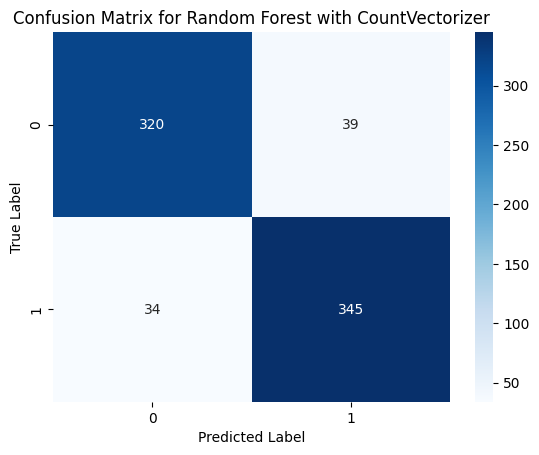

Classification Report for Random Forest with TFIDFVectorizer:
               precision    recall  f1-score   support

           0       0.90      0.87      0.89       359
           1       0.88      0.91      0.89       379

    accuracy                           0.89       738
   macro avg       0.89      0.89      0.89       738
weighted avg       0.89      0.89      0.89       738



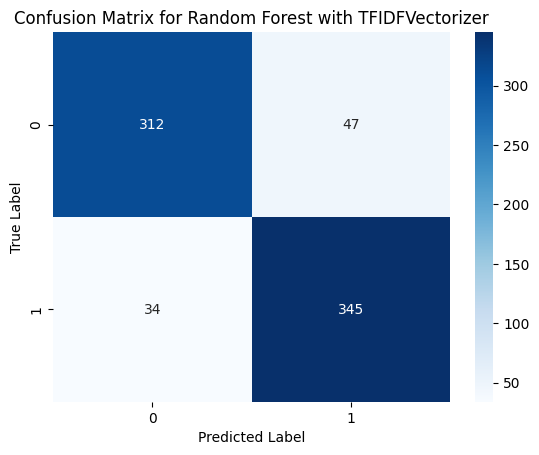

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Define a function to evaluate and visualize model performance
def evaluate_model(y_test, y_pred, model_name):
    # Print the classification report
    print(f"Classification Report for {model_name}:\n", classification_report(y_test, y_pred, zero_division=0))

    # Generate and visualize the confusion matrix
    conf_matrix = confusion_matrix(y_test, y_pred)
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues")
    plt.title(f"Confusion Matrix for {model_name}")
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()

# Evaluate and visualize each model
evaluate_model(y_test, y_pred_lr_count, "Logistic Regression with CountVectorizer")
evaluate_model(y_test, y_pred_lr_tfidf, "Logistic Regression with TFIDFVectorizer")
evaluate_model(y_test, y_pred_svc_count, "SVC with CountVectorizer")
evaluate_model(y_test, y_pred_svc_tfidf, "SVC with TFIDFVectorizer")
evaluate_model(y_test, y_pred_rf_count, "Random Forest with CountVectorizer")
evaluate_model(y_test, y_pred_rf_tfidf, "Random Forest with TFIDFVectorizer")


##Conclusion

The integration of NLP preprocessing with effective vectorization and robust machine learning classifiers has proven successful in distinguishing between fake and real news titles. Logistic Regression and SVC models, when combined with TFIDFVectorizer, achieved the highest accuracy of 90%, demonstrating their efficacy in this classification task. Additionally, Random Forest classifiers showed competitive performance, especially with CountVectorizer. These findings highlight the critical role of vectorization techniques in enhancing model performance and provide a solid foundation for future advancements in automated fake news detection systems.

In [ ]:
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc
!pip install pypandoc

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  dvisvgm fonts-droid-fallback fonts-lato fonts-lmodern fonts-noto-mono fonts-texgyre
  fonts-urw-base35 libapache-pom-java libcmark-gfm-extensions0.29.0.gfm.3 libcmark-gfm0.29.0.gfm.3
  libcommons-logging-java libcommons-parent-java libfontbox-java libfontenc1 libgs9 libgs9-common
  libidn12 libijs-0.35 libjbig2dec0 libkpathsea6 libpdfbox-java libptexenc1 libruby3.0 libsynctex2
  libteckit0 libtexlua53 libtexluajit2 libwoff1 libzzip-0-13 lmodern pandoc-data poppler-data
  preview-latex-style rake ruby ruby-net-telnet ruby-rubygems ruby-webrick ruby-xmlrpc ruby3.0
  rubygems-integration t1utils teckit tex-common tex-gyre texlive-base texlive-binaries
  texlive-fonts-recommended texlive-latex-base texlive-latex-recommended texlive-pictures
  texlive-plain-generic tipa xfonts-encodings xfonts-utils
Suggested packages:
  fonts-noto fonts-fre

In [ ]:
!jupyter nbconvert --to PDF "drive/My drive/Colab Notebooks/Vidisha_B3_131_NLP1.ipynb"

In [ ]:
!jupyter nbconvert --to webpdf Vidisha_B3_131_NLP1.ipynb

[NbConvertApp] WARNING | pattern 'Vidisha_B3_131_NLP1.ipynb' matched no files
This application is used to convert notebook files (*.ipynb)
        to various other formats.


Options
The options below are convenience aliases to configurable class-options,
as listed in the "Equivalent to" description-line of the aliases.
To see all configurable class-options for some <cmd>, use:
    <cmd> --help-all

--debug
    set log level to logging.DEBUG (maximize logging output)
    Equivalent to: [--Application.log_level=10]
--show-config
    Show the application's configuration (human-readable format)
    Equivalent to: [--Application.show_config=True]
--show-config-json
    Show the application's configuration (json format)
    Equivalent to: [--Application.show_config_json=True]
--generate-config
    generate default config file
    Equivalent to: [--JupyterApp.generate_config=True]
-y
    Answer yes to any questions instead of prompting.
    Equivalent to: [--JupyterApp.answer_yes=True]
--exe